# IMPORT LIBRARY

In [2]:
from google.colab import drive
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from PIL import Image
import os, shutil, random
import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# MOUNT GOOGLE DRIVE

In [3]:
try:
    !fusermount -u /content/drive
except:
    pass
drive.mount('/content/drive')

fusermount: failed to unmount /content/drive: No such file or directory
Mounted at /content/drive


# KONFIGURASI PATH

In [4]:
path_sumber = '/content/drive/MyDrive/Dataset_CitraWajah/Dataset_V3'
path_tujuan = '/content/drive/MyDrive/Dataset_CitraWajah/Dataset_Final'
IMG_SIZE    = 224

---
# PERTANYAAN BISNIS

1. Bagaimana distribusi jumlah data pada setiap kategori emosi?
2. Apakah dataset telah memenuhi kualitas dan kelayakan untuk digunakan dalam pengembangan sistem deteksi emosi?
3. Bagaimana karakteristik ukuran dan resolusi gambar pada setiap kategori emosi?
4. Bagaimana kualitas visual citra wajah pada setiap kategori emosi sebelum dan sesudah proses cleaning?
5. Bagaimana representasi visual ekspresi wajah pada setiap kategori emosi berdasarkan sampel gambar yang tersedia?

---
# DATA UNDERSTANDING

## 1. Load Dataset ke DataFrame

In [5]:
image_paths, labels = [], []

for emo in os.listdir(path_sumber):
    emo_path = os.path.join(path_sumber, emo)
    if os.path.isdir(emo_path):
        for img_name in os.listdir(emo_path):
            if img_name.lower().endswith(('.png', '.jpg', '.jpeg')):
                image_paths.append(os.path.join(emo_path, img_name))
                labels.append(emo)

df = pd.DataFrame({'path': image_paths, 'label': labels})
df['label'] = df['label'].str.strip().str.lower()

print("=" * 40)
print("RINGKASAN DATASET")
print("=" * 40)
print(f"Total gambar : {len(df)}")
print(f"Jumlah kelas : {df['label'].nunique()}")
print(f"Nama kelas   : {sorted(df['label'].unique())}")
print()
print("Jumlah per kelas:")
print(df['label'].value_counts().to_string())

RINGKASAN DATASET
Total gambar : 1049
Jumlah kelas : 7
Nama kelas   : ['angry', 'disgust', 'fear', 'happy', 'neutral', 'sad', 'surprise']

Jumlah per kelas:
label
happy       162
surprise    160
neutral     160
fear        156
angry       155
disgust     149
sad         107


Tahap data collection berhasil mengumpulkan sebanyak 1.049 gambar yang terbagi ke dalam tujuh kategori emosi. Dataset telah disusun berdasarkan label emosi sehingga memudahkan proses identifikasi, pengelolaan, dan pengolahan data pada tahapan berikutnya.

## 2. Distribusi Kelas — Bar Chart & Pie Chart

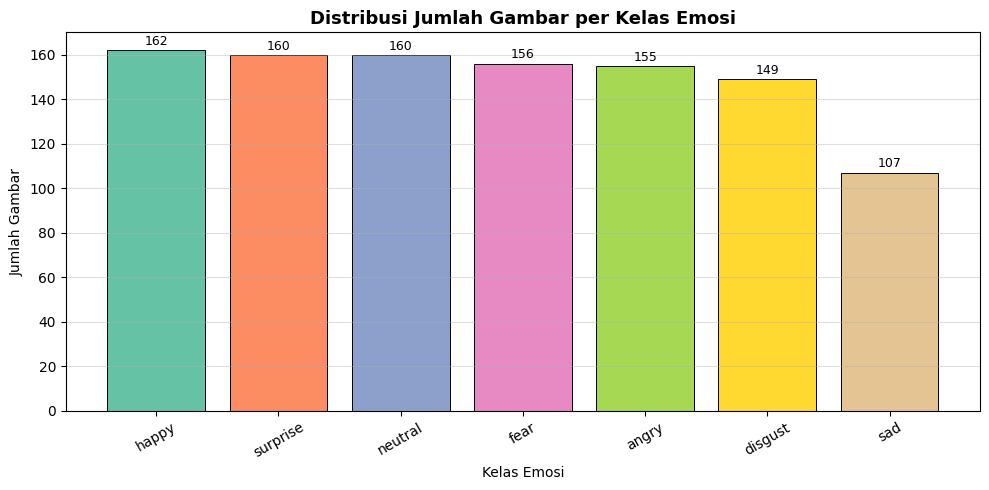

In [6]:
label_counts = df['label'].value_counts()
colors = sns.color_palette('Set2', len(label_counts))

# Bar Chart
plt.figure(figsize=(10, 5))
bars = plt.bar(label_counts.index, label_counts.values, color=colors, edgecolor='black', linewidth=0.7)
plt.title('Distribusi Jumlah Gambar per Kelas Emosi', fontsize=13, fontweight='bold')
plt.xlabel('Kelas Emosi')
plt.ylabel('Jumlah Gambar')
plt.xticks(rotation=30)
for bar in bars:
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
             str(int(bar.get_height())), ha='center', va='bottom', fontsize=9)
plt.grid(axis='y', alpha=0.4)
plt.tight_layout()
plt.show()


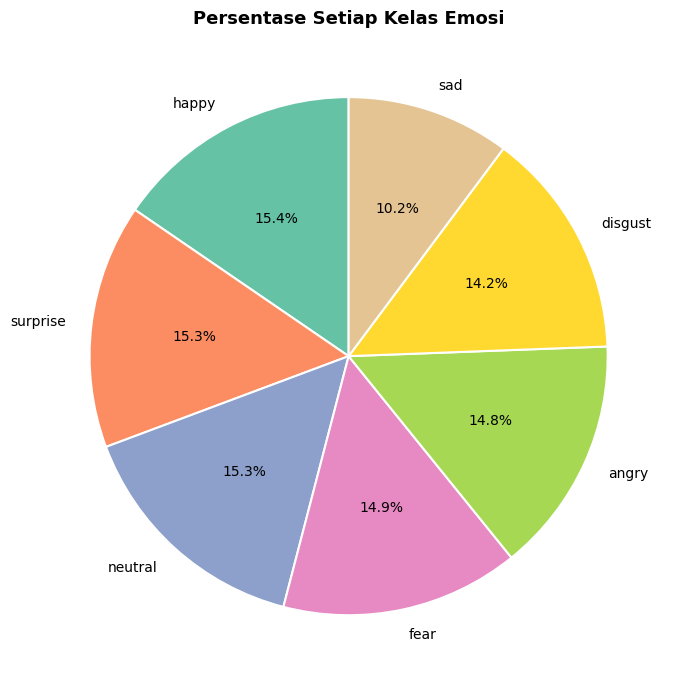

Kelas terbanyak : 'happy' (162 gambar)
Kelas terkecil  : 'sad' (107 gambar)
Rasio imbalance : 1.51x
PERLU AUGMENTASI


In [7]:
# Pie Chart
plt.figure(figsize=(7, 7))
plt.pie(label_counts.values, labels=label_counts.index, autopct='%1.1f%%',
        colors=colors, startangle=90, wedgeprops=dict(edgecolor='white', linewidth=1.5))
plt.title('Persentase Setiap Kelas Emosi', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

ratio = label_counts.max() / label_counts.min()
print(f"Kelas terbanyak : '{label_counts.idxmax()}' ({label_counts.max()} gambar)")
print(f"Kelas terkecil  : '{label_counts.idxmin()}' ({label_counts.min()} gambar)")
print(f"Rasio imbalance : {ratio:.2f}x")
print("PERLU AUGMENTASI" if ratio > 1.5 else "Dataset relatif seimbang")

Distribusi data antar kelas belum sepenuhnya seimbang. Kelas happy memiliki jumlah data terbanyak, sedangkan kelas sad memiliki jumlah data paling sedikit. Oleh karena itu, diperlukan augmentasi untuk membantu meningkatkan keseimbangan data sebelum proses pelatihan model.

## 3. Ukuran & Resolusi Gambar

In [8]:
print("\n=== CEK UKURAN GAMBAR (sampel pertama tiap kelas) ===")
for emotion in sorted(os.listdir(path_sumber)):
    folder = os.path.join(path_sumber, emotion)
    if not os.path.isdir(folder) or len(os.listdir(folder)) == 0:
        continue
    img = cv2.imread(os.path.join(folder, os.listdir(folder)[0]))
    if img is not None:
        h, w, c = img.shape
        print(f"  {emotion:<12}: {w}x{h} px, {c} channel")


=== CEK UKURAN GAMBAR (sampel pertama tiap kelas) ===
  Angry       : 562x762 px, 3 channel
  Disgust     : 562x762 px, 3 channel
  Fear        : 562x762 px, 3 channel
  Happy       : 562x762 px, 3 channel
  Neutral     : 562x762 px, 3 channel
  Sad         : 1024x1024 px, 3 channel
  Surprise    : 562x762 px, 3 channel


Hasil analisis menunjukkan bahwa seluruh gambar mengunakan warna dengan 3 channel, sehingga tidak diperlukan penyesuaian format warna pada tahap awal pengolahan data. Namun, terdapat perbedaan ukuran gambar antar kategori yang menunjukkan bahwa dataset belum memiliki dimensi yang seragam.


=== STATISTIK UKURAN GAMBAR PER KELAS ===
         height             width           
           mean  min   max   mean  min   max
label                                       
angry     716.1   48   970  533.3   48   633
disgust   731.4  256   762  543.5  256   562
fear      713.3  256   762  532.6  256   562
happy     733.5  145  1319  556.9  145  1319
neutral   720.1  256  1122  545.1  256  1122
sad       623.7  169  1127  498.5  169  1127
surprise  724.3  190  1206  549.3  190  1206


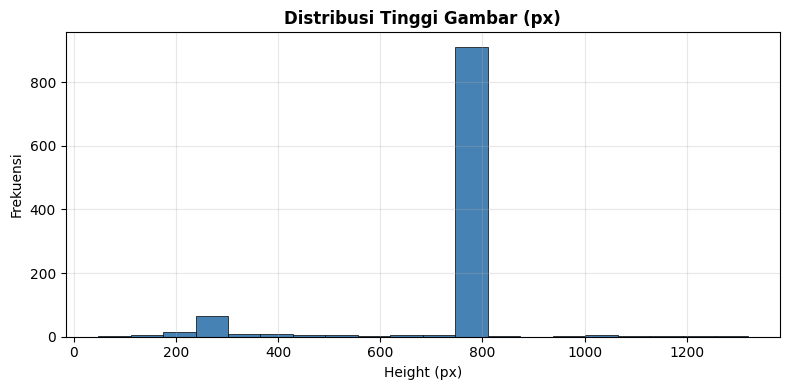

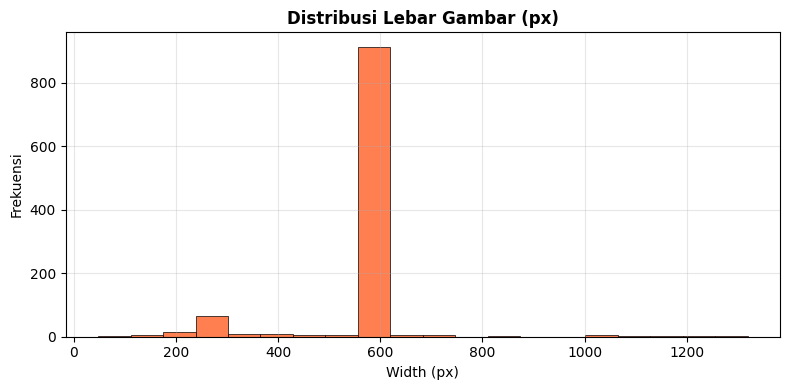

In [10]:
sizes = []
for path, label in zip(df['path'], df['label']):
    img = cv2.imread(path)
    if img is not None:
        h, w = img.shape[:2]
        sizes.append({'label': label, 'height': h, 'width': w})

size_df = pd.DataFrame(sizes)
print("\n=== STATISTIK UKURAN GAMBAR PER KELAS ===")
print(size_df.groupby('label')[['height', 'width']].agg(['mean', 'min', 'max']).round(1).to_string())

# Histogram tinggi
plt.figure(figsize=(8, 4))
plt.hist(size_df['height'], bins=20, color='steelblue', edgecolor='black', linewidth=0.5)
plt.title('Distribusi Tinggi Gambar (px)', fontsize=12, fontweight='bold')
plt.xlabel('Height (px)')
plt.ylabel('Frekuensi')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# Histogram lebar
plt.figure(figsize=(8, 4))
plt.hist(size_df['width'], bins=20, color='coral', edgecolor='black', linewidth=0.5)
plt.title('Distribusi Lebar Gambar (px)', fontsize=12, fontweight='bold')
plt.xlabel('Width (px)')
plt.ylabel('Frekuensi')
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

## 4. Contoh Gambar per Kelas (Dataset Asli — Belum Diproses)

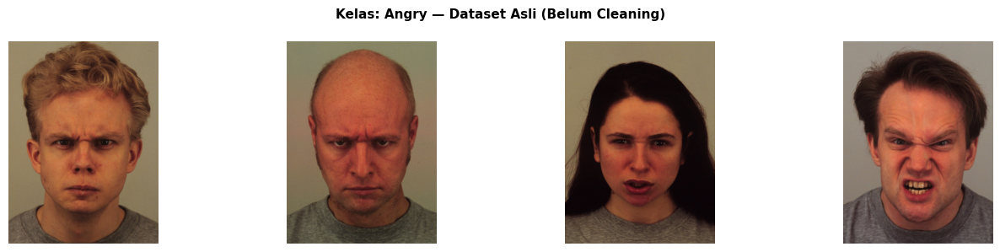

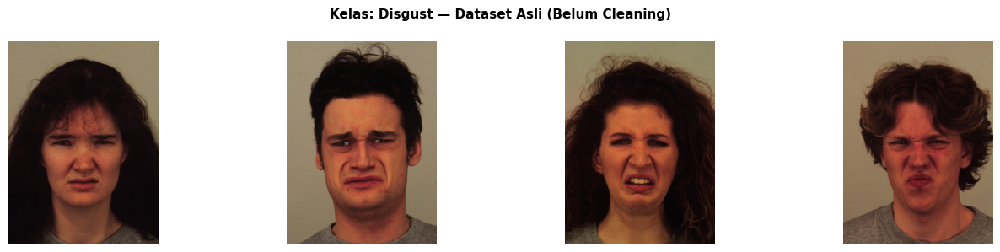

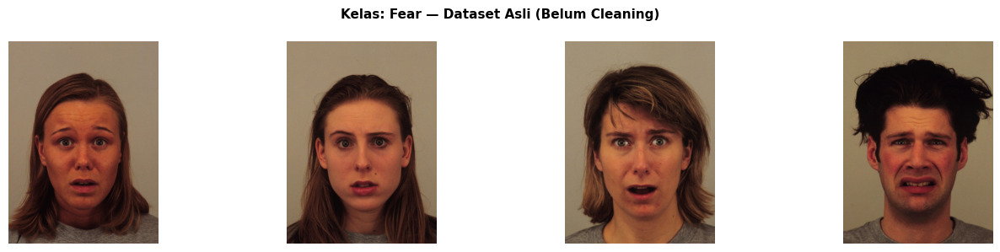

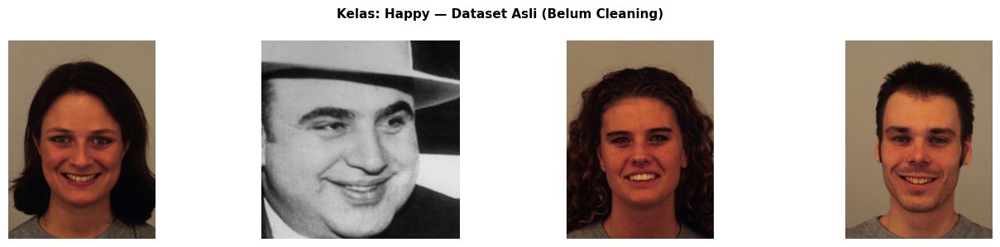

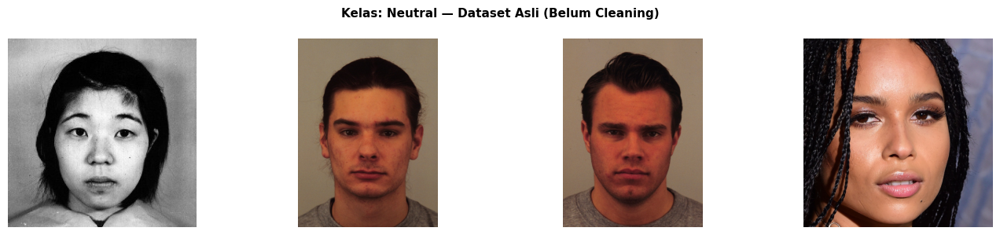

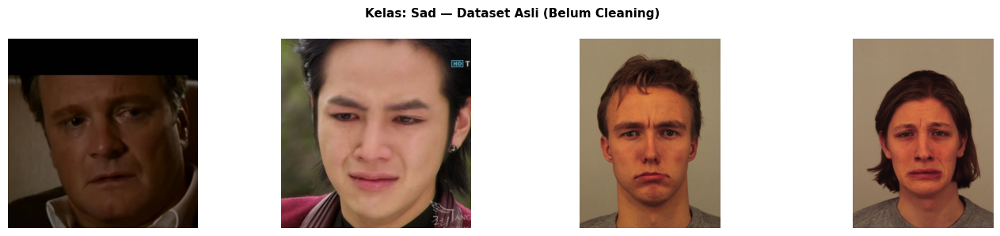

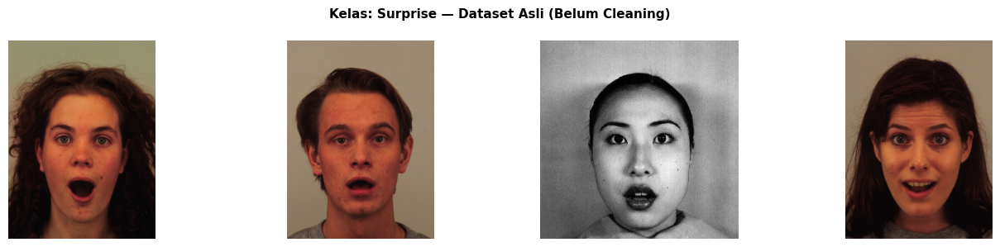

In [11]:
emotions_list = sorted(os.listdir(path_sumber))
n_cols = 4

for i, emotion in enumerate(emotions_list):
    folder = os.path.join(path_sumber, emotion)
    files  = [f for f in os.listdir(folder) if f.lower().endswith(('.jpg','.png','.jpeg'))]
    samples = random.sample(files, min(n_cols, len(files)))

    plt.figure(figsize=(14, 3))
    plt.suptitle(f'Kelas: {emotion} — Dataset Asli (Belum Cleaning)', fontsize=11, fontweight='bold')
    for j, fname in enumerate(samples):
        img = cv2.imread(os.path.join(folder, fname))
        plt.subplot(1, n_cols, j + 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
    plt.tight_layout()
    plt.show()

Insight :
- Sampel gambar menunjukkan bahwa setiap kategori emosi memiliki karakteristik ekspresi wajah yang berbeda
- Dataset mengantung variasi individu, pose, pencahayaan, dan latar belakang yang cukup beragam
- Keragaman visual ini penting untuk membantu model mempelajari pola emosi yang lebih general dan tidak bergantung pada karakteristik tertentu.
- Variasi ukuran gambar tersebut perlu ditangani melalui proses standardisasi ukuran agar seluruh citra memiliki format yang konsisten sebelum digunakan dalam pelatihan model.

## 5. Analisis Kualitas Dataset Asli (Sebelum Cleaning)

> Bagian ini membuktikan secara kuantitatif bahwa dataset asli memiliki kualitas rendah,
> sehingga diperlukan proses **cleaning + upscale**

In [ ]:
def check_sharpness(img_bgr):
    """Laplacian variance — semakin tinggi semakin tajam"""
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    return cv2.Laplacian(gray, cv2.CV_64F).var()

def check_brightness(img_bgr):
    """Mean pixel grayscale — 0 gelap, 255 terang"""
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    return gray.mean()

def check_contrast(img_bgr):
    """Standar deviasi grayscale — semakin tinggi kontras semakin baik"""
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    return gray.std()

quality_data = []

for emo in sorted(os.listdir(path_sumber)):
    folder = os.path.join(path_sumber, emo)
    if not os.path.isdir(folder): continue
    files = [f for f in os.listdir(folder) if f.lower().endswith(('.jpg','.png','.jpeg'))]
    for fname in random.sample(files, min(40, len(files))):
        img = cv2.imread(os.path.join(folder, fname))
        if img is not None:
            quality_data.append({
                'label'     : emo,
                'sharpness' : check_sharpness(img),
                'brightness': check_brightness(img),
                'contrast'  : check_contrast(img),
                'height'    : img.shape[0],
                'width'     : img.shape[1],
            })

quality_df = pd.DataFrame(quality_data)

print("=" * 55)
print("ANALISIS KUALITAS DATASET ASLI")
print("=" * 55)
print(quality_df[['sharpness','brightness','contrast']].describe().round(2).to_string())
print()

# Threshold penilaian
avg_sharp  = quality_df['sharpness'].mean()
avg_bright = quality_df['brightness'].mean()
avg_cont   = quality_df['contrast'].mean()
pct_blur   = (quality_df['sharpness'] < 100).mean() * 100
pct_dark   = (quality_df['brightness'] < 80).mean() * 100
pct_lowcon = (quality_df['contrast'] < 30).mean() * 100

print(f"Rata-rata Sharpness  : {avg_sharp:.2f}  {'(RENDAH - gambar blur)' if avg_sharp < 200 else '(Cukup)'}")
print(f"Rata-rata Brightness : {avg_bright:.2f} {'(GELAP)' if avg_bright < 80 else '(Normal)'}")
print(f"Rata-rata Contrast   : {avg_cont:.2f}  {'(RENDAH)' if avg_cont < 30 else '(Cukup)'}")
print()
print(f"% Gambar blur (sharpness < 100) : {pct_blur:.1f}%")
print(f"% Gambar gelap (brightness < 80): {pct_dark:.1f}%")
print(f"% Gambar kontras rendah (< 30)  : {pct_lowcon:.1f}%")
print()
print("KESIMPULAN: Dataset asli perlu cleaning + upscale untuk meningkatkan kualitas.")

Insight :
- Analisis kualitas menunjukkan bahwa sebagian gambar memiliki tingkat ketajaman dan pencahayaan yang belum optimal
- Beberapa citra masih mengandung noise wajah yang kurang jelas
- kondisi tersebut dapat mengurangi kemampuan model dalam mengenali fitur wajah secara akurat, Oleh karena itu dilakukan proses cleaning untuk meningkatkan kualitas visual citra

/tmp/ipykernel_2884/1390302415.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=quality_df2, x='label', y='sharpness',


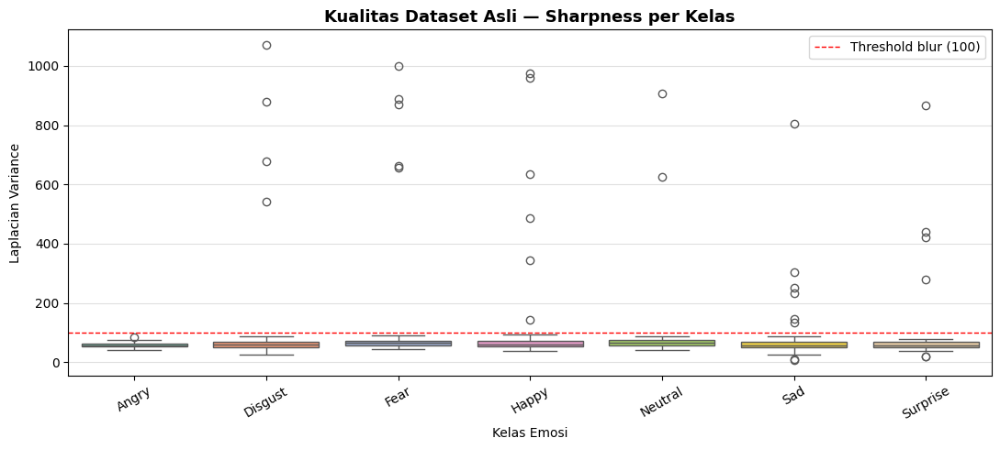

/tmp/ipykernel_2884/1390302415.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=quality_df2, x='label', y='brightness',


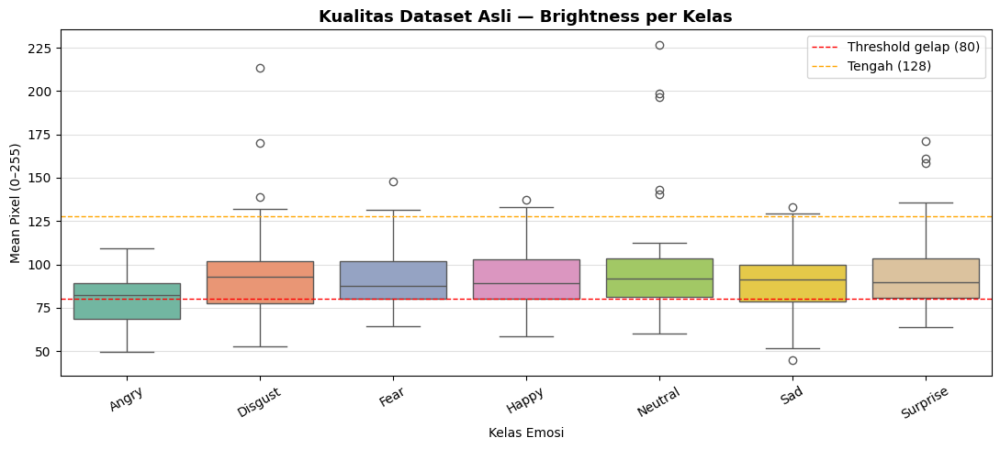

/tmp/ipykernel_2884/1390302415.py:34: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=quality_df2, x='label', y='contrast',


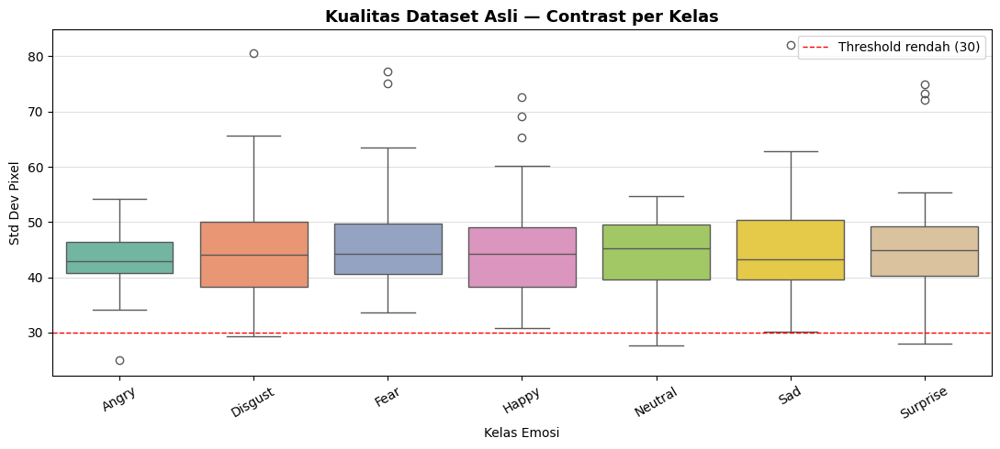

In [ ]:
quality_df2 = quality_df.copy()

# Sharpness
plt.figure(figsize=(11, 5))
sns.boxplot(data=quality_df2, x='label', y='sharpness',
            palette='Set2', order=sorted(quality_df2['label'].unique()))
plt.title('Kualitas Dataset Asli — Sharpness per Kelas', fontsize=13, fontweight='bold')
plt.xlabel('Kelas Emosi')
plt.ylabel('Laplacian Variance')
plt.axhline(y=100, color='red', linestyle='--', linewidth=1, label='Threshold blur (100)')
plt.legend()
plt.xticks(rotation=30)
plt.grid(axis='y', alpha=0.4)
plt.tight_layout()
plt.show()

# Brightness
plt.figure(figsize=(11, 5))
sns.boxplot(data=quality_df2, x='label', y='brightness',
            palette='Set2', order=sorted(quality_df2['label'].unique()))
plt.title('Kualitas Dataset Asli — Brightness per Kelas', fontsize=13, fontweight='bold')
plt.xlabel('Kelas Emosi')
plt.ylabel('Mean Pixel (0–255)')
plt.axhline(y=80,  color='red',    linestyle='--', linewidth=1, label='Threshold gelap (80)')
plt.axhline(y=128, color='orange', linestyle='--', linewidth=1, label='Tengah (128)')
plt.legend()
plt.xticks(rotation=30)
plt.grid(axis='y', alpha=0.4)
plt.tight_layout()
plt.show()

# Contrast
plt.figure(figsize=(11, 5))
sns.boxplot(data=quality_df2, x='label', y='contrast',
            palette='Set2', order=sorted(quality_df2['label'].unique()))
plt.title('Kualitas Dataset Asli — Contrast per Kelas', fontsize=13, fontweight='bold')
plt.xlabel('Kelas Emosi')
plt.ylabel('Std Dev Pixel')
plt.axhline(y=30, color='red', linestyle='--', linewidth=1, label='Threshold rendah (30)')
plt.legend()
plt.xticks(rotation=30)
plt.grid(axis='y', alpha=0.4)
plt.tight_layout()
plt.show()

## 6. Cek Gambar Rusak (Corrupt)

In [ ]:
broken = [p for p in df['path'] if cv2.imread(p) is None]
print(f"Total diperiksa : {len(df)}")
print(f"Gambar rusak    : {len(broken)}")
if broken:
    for p in broken: print(f"  {p}")
else:
    print("Tidak ada gambar rusak.")

Total diperiksa : 1049
Gambar rusak    : 0
Tidak ada gambar rusak.


Insight :
Pemeriksaan gambar rusak dilakukan untuk memastikan seluruh file dapat dibaca dan diproses dengan baik. Gambar yang rusak berpotensi menyebabkan error selama preprocessing maupun training. Penghapusan file yang tidak valid dapat membantu menjaga kualitas dan konsistensi dataset.

## 7. Ringkasan Data Understanding

In [ ]:
ratio = df['label'].value_counts().max() / df['label'].value_counts().min()
print("=" * 55)
print("RINGKASAN DATA UNDERSTANDING")
print("=" * 55)
print(f"Total data           : {len(df)} gambar")
print(f"Jumlah kelas         : {df['label'].nunique()}")
print(f"Distribusi           : {'Tidak Seimbang — perlu augmentasi' if ratio > 1.5 else 'Seimbang'}")
print(f"Ukuran gambar        : Beragam — perlu resize/upscale")
print(f"Gambar rusak         : {len(broken)}")
print(f"Rata-rata sharpness  : {quality_df['sharpness'].mean():.2f} — {'RENDAH, perlu upscale' if quality_df['sharpness'].mean() < 200 else 'Cukup baik'}")
print(f"Rata-rata brightness : {quality_df['brightness'].mean():.2f}")
print(f"Rata-rata contrast   : {quality_df['contrast'].mean():.2f}")
print("=" * 55)

RINGKASAN DATA UNDERSTANDING
Total data           : 1049 gambar
Jumlah kelas         : 7
Distribusi           : Tidak Seimbang — perlu augmentasi
Ukuran gambar        : Beragam — perlu resize/upscale
Gambar rusak         : 0
Rata-rata sharpness  : 111.02 — RENDAH, perlu upscale
Rata-rata brightness : 92.07
Rata-rata contrast   : 44.99


**Insight** :
Dataset memiliki variasi emosi yang cukup representatif untuk tugas klasifikasi emosi wajah. Namun ditemukan beberapa tantangan seperti ketidakseimbangan kelas, variasi ukuran gambar, dan kualitas visual yang belum seragam. Oleh karena itu diperlukan tahap cleaning dan augmentasi sebelum dataset digunakan untuk pengembangan model.

---
# DATA CLEANING

## 1. Siapkan Folder Output

In [ ]:
if os.path.exists(path_tujuan):
    shutil.rmtree(path_tujuan)
    print("Folder lama dihapus.")
os.makedirs(path_tujuan, exist_ok=True)
print(f"Folder output siap: {path_tujuan}")

Folder lama dihapus.
Folder output siap: /content/drive/MyDrive/Dataset_CitraWajah/Dataset_Final


## 2. UPSCALE GAMBAR

> Gambar asli memiliki resolusi kecil dan tampak blur.
> Upscale dilakukan menggunakan **cv2.INTER_CUBIC** untuk memperbesar gambar
> ke resolusi **224x224 px** dengan kualitas tinggi, agar detail wajah lebih terlihat jelas
> saat digunakan untuk training AI.

TAHAP UPSCALE GAMBAR
Metode : cv2.resize dengan INTER_CUBIC
Target : 224x224 px

Contoh kelas : Angry
Ukuran asli : 562x762 px
Ukuran upscale : 224x224 px
Sharpness asli    : 91.80
Sharpness upscale : 2474.25


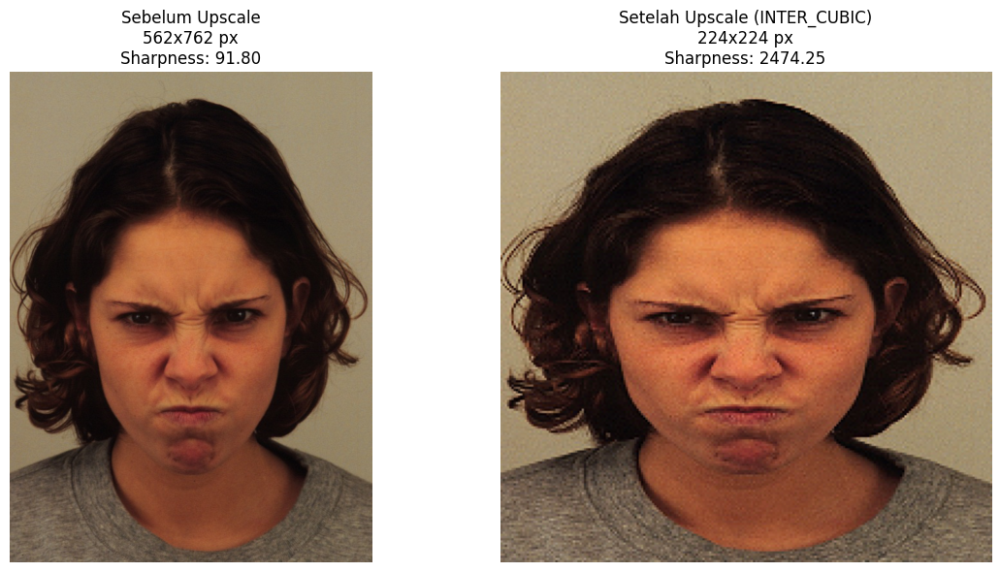

In [12]:
print("=" * 50)
print("TAHAP UPSCALE GAMBAR")
print("=" * 50)

print(f"Metode : cv2.resize dengan INTER_CUBIC")
print(f"Target : {IMG_SIZE}x{IMG_SIZE} px")

# ==================================================
# AMBIL SAMPLE GAMBAR
# ==================================================
sample_emo = sorted(os.listdir(path_sumber))[0]

sample_folder = os.path.join(
    path_sumber,
    sample_emo
)

sample_file = [
    f for f in os.listdir(sample_folder)
    if f.lower().endswith(('.jpg', '.png', '.jpeg'))
][0]

sample_path = os.path.join(
    sample_folder,
    sample_file
)

# ==================================================
# LOAD GAMBAR
# ==================================================
img_ori = cv2.imread(sample_path)

# UPSCALE
img_up = cv2.resize(
    img_ori,
    (IMG_SIZE, IMG_SIZE),
    interpolation=cv2.INTER_CUBIC
)
# ==================================================
# SHARPENING TAMBAHAN
# ==================================================
kernel = np.array([
    [0, -0.2, 0],
    [-0.2, 1.9, -0.2],
    [0, -0.2, 0]
])

img_up = cv2.filter2D(
    img_up,
    -1,
    kernel
)

# ==================================================
# FUNCTION SHARPNESS
# ==================================================
def check_sharpness(image):

    gray = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2GRAY
    )

    return cv2.Laplacian(
        gray,
        cv2.CV_64F
    ).var()

# ==================================================
# SHARPNESS SCORE
# ==================================================
sharp_ori = check_sharpness(img_ori)
sharp_up = check_sharpness(img_up)

# ==================================================
# INFO GAMBAR
# ==================================================
print(f"\nContoh kelas : {sample_emo}")

print(
    f"Ukuran asli : "
    f"{img_ori.shape[1]}x{img_ori.shape[0]} px"
)

print(
    f"Ukuran upscale : "
    f"{img_up.shape[1]}x{img_up.shape[0]} px"
)

print(f"Sharpness asli    : {sharp_ori:.2f}")
print(f"Sharpness upscale : {sharp_up:.2f}")

# ==================================================
# BGR → RGB
# ==================================================
img_ori_rgb = cv2.cvtColor(
    img_ori,
    cv2.COLOR_BGR2RGB
)

img_up_rgb = cv2.cvtColor(
    img_up,
    cv2.COLOR_BGR2RGB
)

# ==================================================
# VISUALISASI
# ==================================================
plt.figure(figsize=(12,6))

# BEFORE
plt.subplot(1,2,1)
plt.imshow(img_ori_rgb)
plt.title(
    f"Sebelum Upscale\n"
    f"{img_ori.shape[1]}x{img_ori.shape[0]} px\n"
    f"Sharpness: {sharp_ori:.2f}"
)
plt.axis('off')

# AFTER
plt.subplot(1,2,2)
plt.imshow(img_up_rgb)
plt.title(
    f"Setelah Upscale (INTER_CUBIC)\n"
    f"{IMG_SIZE}x{IMG_SIZE} px\n"
    f"Sharpness: {sharp_up:.2f}"
)

plt.axis('off')
plt.tight_layout()
plt.show()

## 3. Proses Cleaning: Upscale + Denoise + Sharpen

In [ ]:
print("=" * 50)
print("PROSES DATA CLEANING LENGKAP")
print("=" * 50)
print(f"Langkah 1 — Upscale  : resize ke {IMG_SIZE}x{IMG_SIZE} px (INTER_CUBIC)")
print(f"Langkah 2 — Denoise  : fastNlMeansDenoisingColored (kurangi noise)")
print(f"Langkah 3 — Sharpen  : filter kernel (perjelas detail wajah)")
print()

kernel_sharpen = np.array([
    [0, -0.2, 0],
    [-0.2, 1.9, -0.2],
    [0, -0.2, 0]
])
total_saved, total_skip = 0, 0

for emotion in sorted(os.listdir(path_sumber)):
    in_path  = os.path.join(path_sumber, emotion)
    out_path = os.path.join(path_tujuan, emotion)
    if not os.path.isdir(in_path): continue
    os.makedirs(out_path, exist_ok=True)
    saved, skipped = 0, 0

    for img_name in os.listdir(in_path):
        img = cv2.imread(os.path.join(in_path, img_name))
        if img is None:
            skipped += 1; continue

        # Langkah 1: UPSCALE
        img = cv2.resize(img, (IMG_SIZE, IMG_SIZE), interpolation=cv2.INTER_CUBIC)
        # Langkah 2: DENOISE
        img = cv2.fastNlMeansDenoisingColored(img, None, 2, 2, 7, 21)
        # Langkah 3: SHARPEN
        img = cv2.filter2D(img, -1, kernel_sharpen)

        cv2.imwrite(os.path.join(out_path, img_name), img)
        saved += 1

    total_saved += saved; total_skip += skipped
    print(f"  {emotion:<12}: {saved} disimpan, {skipped} dilewati")

print()
print(f"Total tersimpan : {total_saved}")
print(f"Total dilewati  : {total_skip}")
print("CLEANING SELESAI")

PROSES DATA CLEANING LENGKAP
Langkah 1 — Upscale  : resize ke 224x224 px (INTER_CUBIC)
Langkah 2 — Denoise  : fastNlMeansDenoisingColored (kurangi noise)
Langkah 3 — Sharpen  : filter kernel (perjelas detail wajah)

  Angry       : 155 disimpan, 0 dilewati
  Disgust     : 149 disimpan, 0 dilewati
  Fear        : 156 disimpan, 0 dilewati
  Happy       : 162 disimpan, 0 dilewati
  Neutral     : 160 disimpan, 0 dilewati
  Sad         : 107 disimpan, 0 dilewati
  Surprise    : 160 disimpan, 0 dilewati

Total tersimpan : 1049
Total dilewati  : 0
CLEANING SELESAI


## 4. Verifikasi Hasil Cleaning

In [ ]:
print("=== Jumlah Gambar Hasil Cleaning ===")
for emo in sorted(os.listdir(path_tujuan)):
    ep = os.path.join(path_tujuan, emo)
    if os.path.isdir(ep):
        print(f"  {emo:<12}: {len(os.listdir(ep))} gambar")

sizes_set, is_gray = set(), True
for emotion in os.listdir(path_tujuan):
    folder = os.path.join(path_tujuan, emotion)
    for img_name in os.listdir(folder):
        img = cv2.imread(os.path.join(folder, img_name))
        if img is not None:
            sizes_set.add(img.shape)
            if not (np.array_equal(img[:,:,0], img[:,:,1]) and np.array_equal(img[:,:,1], img[:,:,2])):
                is_gray = False

print(f"\nUkuran unik : {sizes_set}")
print(f"Warna       : {'Grayscale' if is_gray else 'RGB (Berwarna)'}")
print("Semua gambar ukurannya seragam." if len(sizes_set) == 1 else "Masih ada variasi ukuran.")

=== Jumlah Gambar Hasil Cleaning ===
  Angry       : 155 gambar
  Disgust     : 149 gambar
  Fear        : 156 gambar
  Happy       : 162 gambar
  Neutral     : 160 gambar
  Sad         : 107 gambar
  Surprise    : 160 gambar

Ukuran unik : {(224, 224, 3)}
Warna       : RGB (Berwarna)
Semua gambar ukurannya seragam.


---
# EDA — SETELAH CLEANING

## 1. Distribusi Kelas Setelah Cleaning

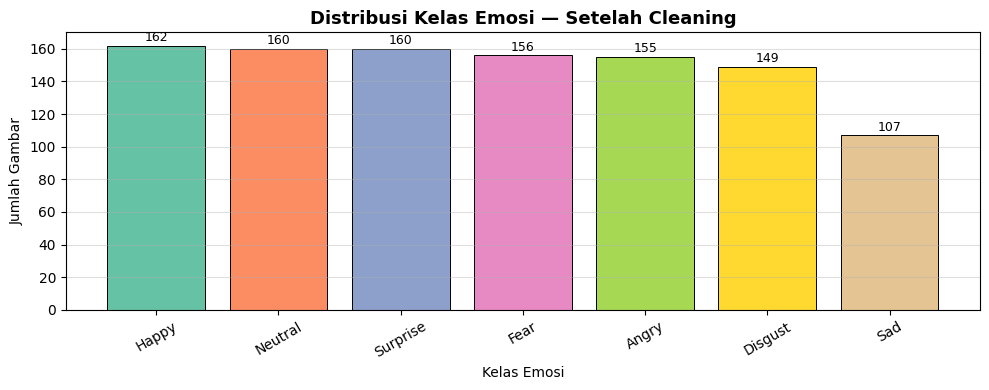

In [ ]:
clean_counts = {}
for emo in sorted(os.listdir(path_tujuan)):
    ep = os.path.join(path_tujuan, emo)
    if os.path.isdir(ep):
        clean_counts[emo] = len(os.listdir(ep))

clean_series = pd.Series(clean_counts).sort_values(ascending=False)
colors = sns.color_palette('Set2', len(clean_series))

plt.figure(figsize=(10, 4))
bars = plt.bar(clean_series.index, clean_series.values, color=colors, edgecolor='black', linewidth=0.7)
plt.title('Distribusi Kelas Emosi — Setelah Cleaning', fontsize=13, fontweight='bold')
plt.xlabel('Kelas Emosi'); plt.ylabel('Jumlah Gambar')
plt.xticks(rotation=30)
for bar in bars:
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 1,
             str(int(bar.get_height())), ha='center', va='bottom', fontsize=9)
plt.grid(axis='y', alpha=0.4); plt.tight_layout(); plt.show()

**Insight :**
Jumlah data pada setiap kelas relatif tetap setelah proses cleaning karena tujuan utama cleaning adalah meningkatkan kualitas gambar, bukan mengubah distribusi kelas. Dataset yang telah dibersihkan memiliki kualitas visual yang lebih baik dibandingkan dataset awal.

## 2. Before vs After Cleaning — Semua Kelas

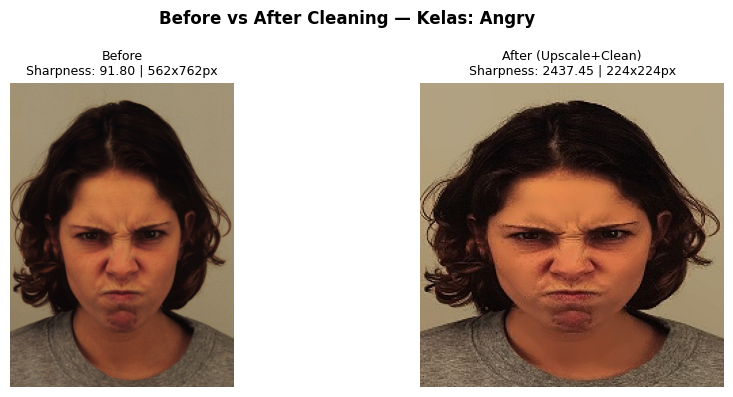

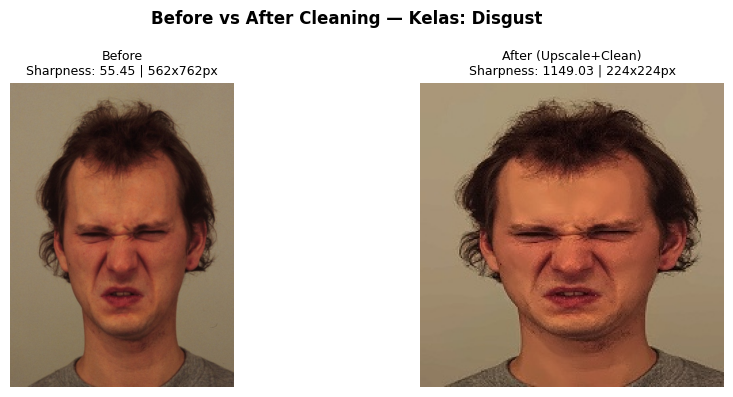

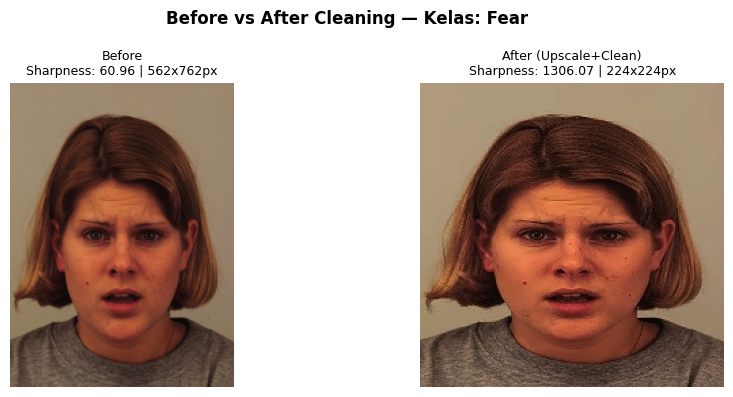

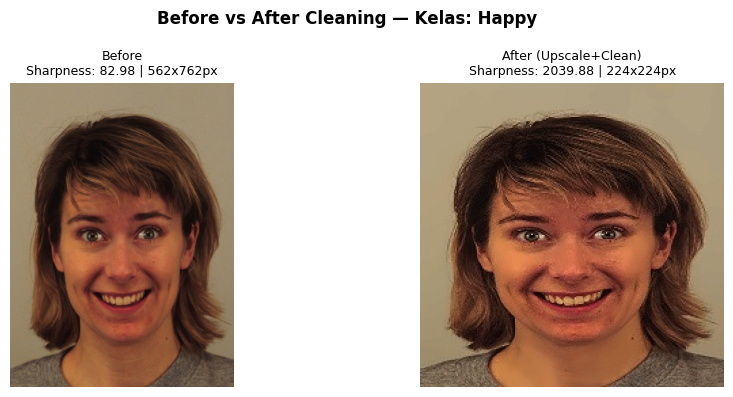

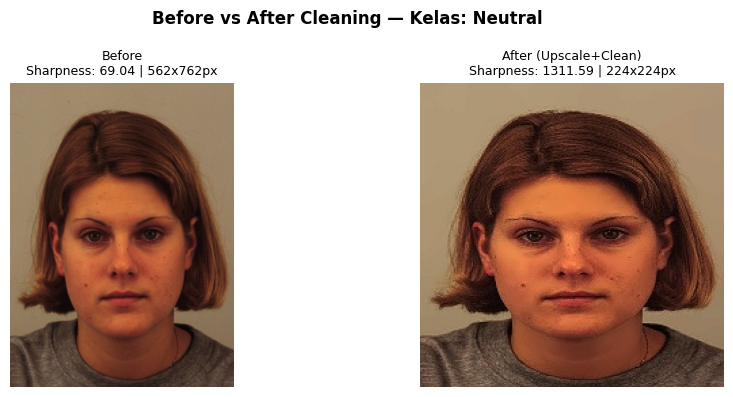

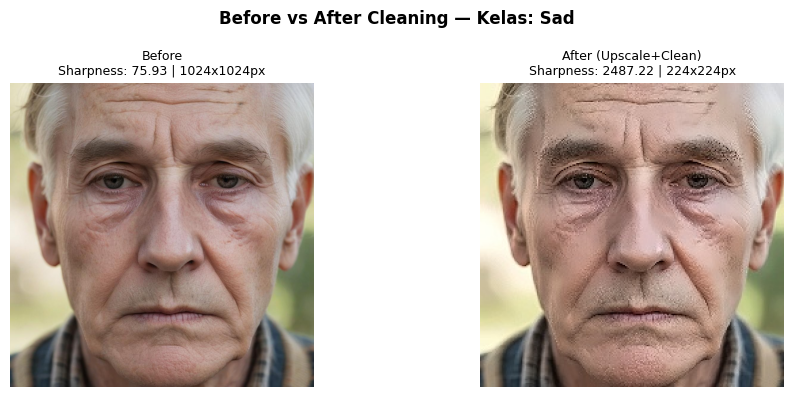

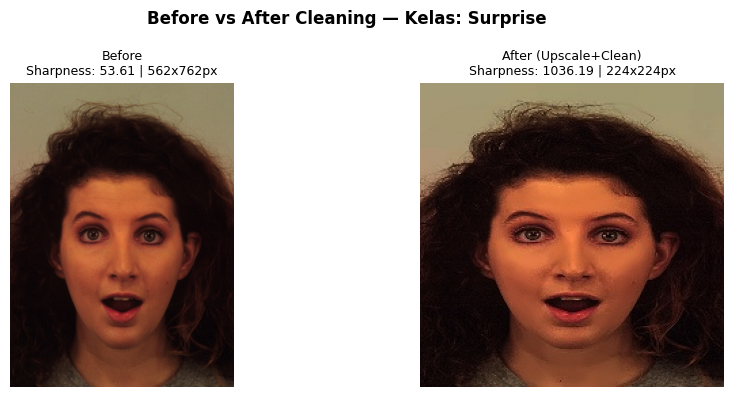

In [ ]:
emotions_clean = sorted(os.listdir(path_tujuan))

for label in emotions_clean:
    bf = os.path.join(path_sumber, label)
    af = os.path.join(path_tujuan, label)
    bf_files = [f for f in os.listdir(bf) if f.lower().endswith(('.jpg','.png','.jpeg'))]
    af_files = [f for f in os.listdir(af) if f.lower().endswith(('.jpg','.png','.jpeg'))]
    if not bf_files or not af_files:
        continue

    img_b = cv2.imread(os.path.join(bf, bf_files[0]))
    img_a = cv2.imread(os.path.join(af, af_files[0]))

    plt.figure(figsize=(10, 4))
    plt.suptitle(f'Before vs After Cleaning — Kelas: {label}', fontsize=12, fontweight='bold')

    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img_b, cv2.COLOR_BGR2RGB))
    plt.title(f"Before\nSharpness: {check_sharpness(img_b):.2f} | {img_b.shape[1]}x{img_b.shape[0]}px", fontsize=9)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(img_a, cv2.COLOR_BGR2RGB))
    plt.title(f"After (Upscale+Clean)\nSharpness: {check_sharpness(img_a):.2f} | {img_a.shape[1]}x{img_a.shape[0]}px", fontsize=9)
    plt.axis('off')

    plt.tight_layout()
    plt.show()

**Insight** : Perbandingan visual menunjukkan peningkatan kualitas gambar setelah cleaning. Detail wajah menjadi lebih jelas, noise berkurang, dan kualitas citra terlihat lebih baik. Hasil ini membantu model memperoleh fitur wajah yang lebih informatif selama proses pelatihan.

## 3. Perbandingan Kualitas: Sebelum vs Sesudah

/tmp/ipykernel_2884/2231238809.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=compare_df, x='status', y='sharpness',


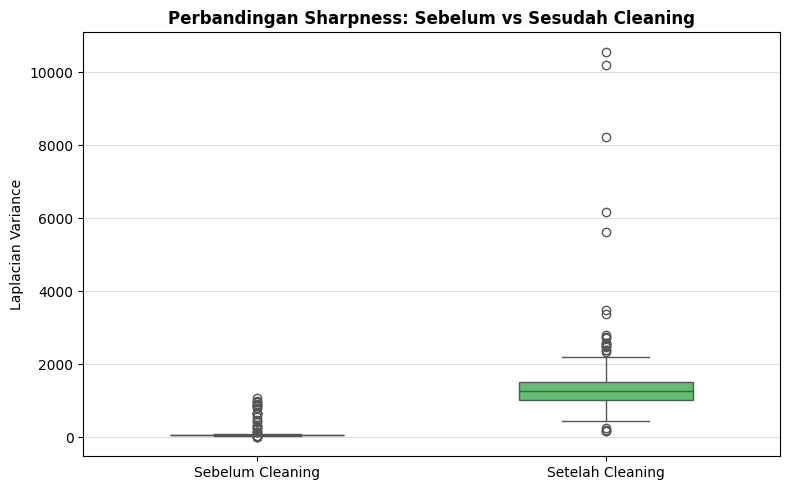

/tmp/ipykernel_2884/2231238809.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=compare_df, x='status', y='brightness',


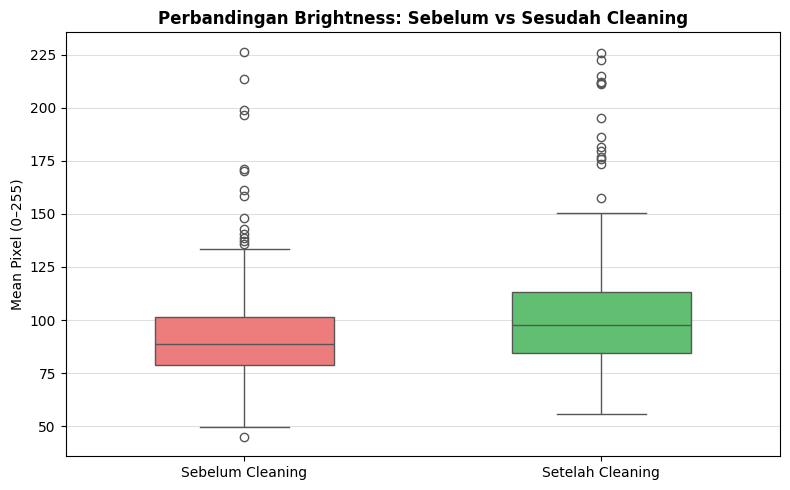

/tmp/ipykernel_2884/2231238809.py:46: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=compare_df, x='status', y='contrast',


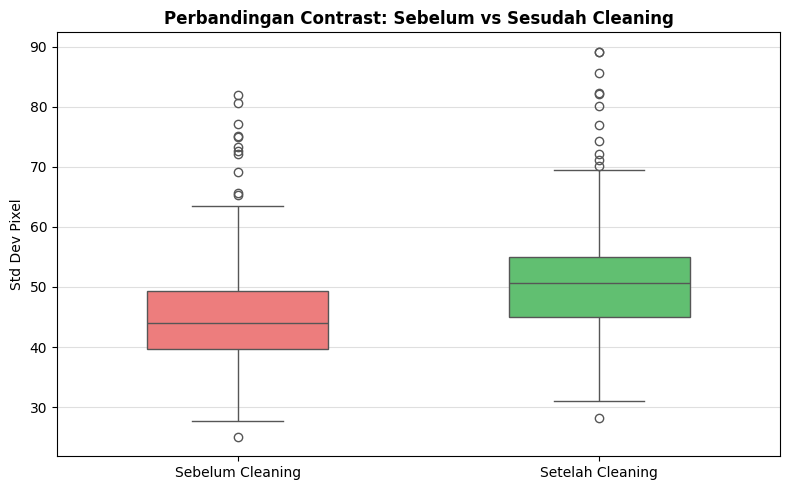

PERBANDINGAN RATA-RATA KUALITAS
Sharpness   :  111.02 -> 1448.36  (naik 1337.34)
Brightness  :   92.07 ->  101.31  (naik 9.24)
Contrast    :   44.99 ->   51.13  (naik 6.14)


In [ ]:
quality_clean = []
for emo in sorted(os.listdir(path_tujuan)):
    folder = os.path.join(path_tujuan, emo)
    if not os.path.isdir(folder): continue
    files = [f for f in os.listdir(folder) if f.lower().endswith(('.jpg','.png','.jpeg'))]
    for fname in random.sample(files, min(40, len(files))):
        img = cv2.imread(os.path.join(folder, fname))
        if img is not None:
            quality_clean.append({
                'label'     : emo,
                'sharpness' : check_sharpness(img),
                'brightness': check_brightness(img),
                'contrast'  : check_contrast(img),
                'status'    : 'Setelah Cleaning'
            })

quality_df['status']  = 'Sebelum Cleaning'
quality_clean_df = pd.DataFrame(quality_clean)
compare_df = pd.concat([quality_df[['sharpness','brightness','contrast','status']],
                        quality_clean_df[['sharpness','brightness','contrast','status']]])

# Sharpness
plt.figure(figsize=(8, 5))
sns.boxplot(data=compare_df, x='status', y='sharpness',
            palette={'Sebelum Cleaning': '#FF6B6B', 'Setelah Cleaning': '#51CF66'}, width=0.5)
plt.title('Perbandingan Sharpness: Sebelum vs Sesudah Cleaning', fontsize=12, fontweight='bold')
plt.xlabel('')
plt.ylabel('Laplacian Variance')
plt.grid(axis='y', alpha=0.4)
plt.tight_layout()
plt.show()

# Brightness
plt.figure(figsize=(8, 5))
sns.boxplot(data=compare_df, x='status', y='brightness',
            palette={'Sebelum Cleaning': '#FF6B6B', 'Setelah Cleaning': '#51CF66'}, width=0.5)
plt.title('Perbandingan Brightness: Sebelum vs Sesudah Cleaning', fontsize=12, fontweight='bold')
plt.xlabel('')
plt.ylabel('Mean Pixel (0–255)')
plt.grid(axis='y', alpha=0.4)
plt.tight_layout()
plt.show()

# Contrast
plt.figure(figsize=(8, 5))
sns.boxplot(data=compare_df, x='status', y='contrast',
            palette={'Sebelum Cleaning': '#FF6B6B', 'Setelah Cleaning': '#51CF66'}, width=0.5)
plt.title('Perbandingan Contrast: Sebelum vs Sesudah Cleaning', fontsize=12, fontweight='bold')
plt.xlabel('')
plt.ylabel('Std Dev Pixel')
plt.grid(axis='y', alpha=0.4)
plt.tight_layout()
plt.show()

print("=" * 55)
print("PERBANDINGAN RATA-RATA KUALITAS")
print("=" * 55)
for metric in ['sharpness', 'brightness', 'contrast']:
    before = quality_df[metric].mean()
    after  = quality_clean_df[metric].mean()
    delta  = after - before
    arrow  = "naik" if delta > 0 else "turun"
    print(f"{metric.capitalize():<12}: {before:>7.2f} -> {after:>7.2f}  ({arrow} {abs(delta):.2f})")
print("=" * 55)

**Insight** : Nilai kualitas setelah cleaning menunjukkan peningkatan dibandingkan dataset awal
Proses denoising, sharpening, dan upscale berhasil meningkatkan kejelasan citra wajah. Peningkatan kualitas ini diharapkan dapat memberikan dampak positif terhadap performa model klasifikasi.

## 4. Sharpness & Brightness per Kelas (Setelah Cleaning)

/tmp/ipykernel_2884/3613470231.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=quality_clean_df, x='label', y='sharpness',


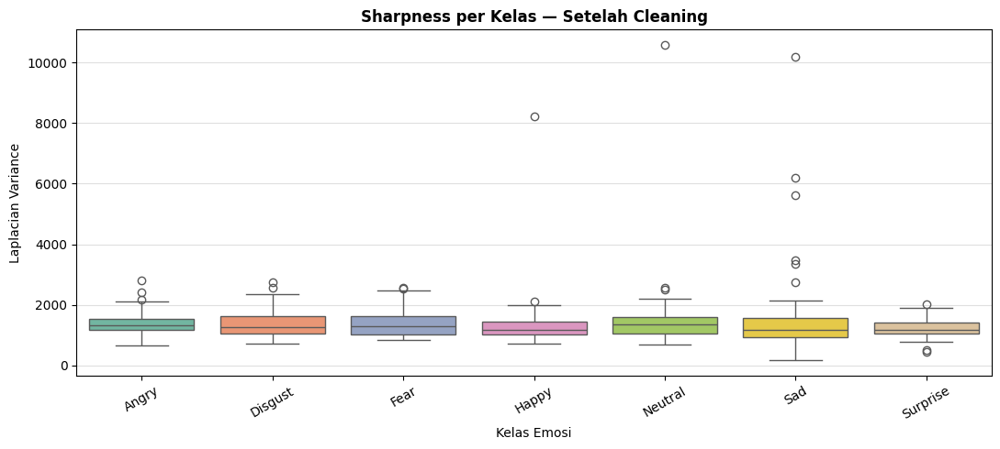

/tmp/ipykernel_2884/3613470231.py:15: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=quality_clean_df, x='label', y='brightness',


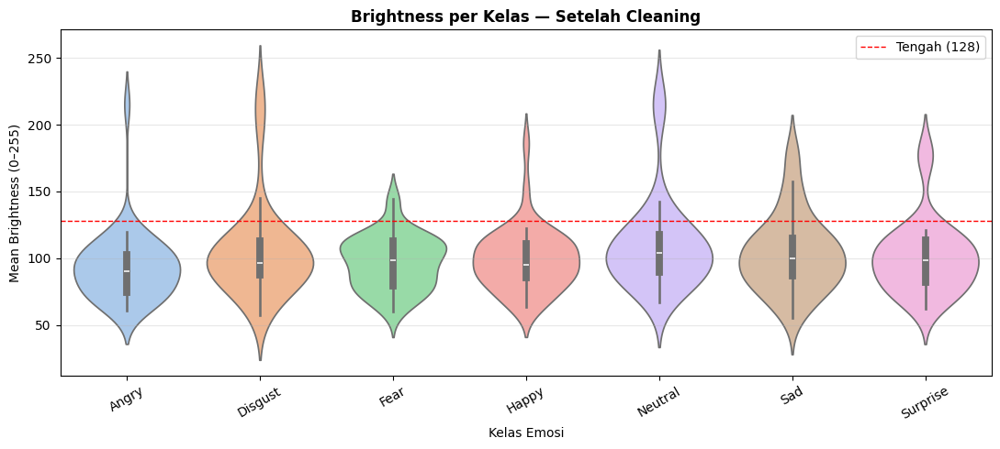

In [ ]:
# Sharpness per kelas setelah cleaning
plt.figure(figsize=(11, 5))
sns.boxplot(data=quality_clean_df, x='label', y='sharpness',
            palette='Set2', order=sorted(quality_clean_df['label'].unique()))
plt.title('Sharpness per Kelas — Setelah Cleaning', fontsize=12, fontweight='bold')
plt.xlabel('Kelas Emosi')
plt.ylabel('Laplacian Variance')
plt.xticks(rotation=30)
plt.grid(axis='y', alpha=0.4)
plt.tight_layout()
plt.show()

# Brightness per kelas setelah cleaning
plt.figure(figsize=(11, 5))
sns.violinplot(data=quality_clean_df, x='label', y='brightness',
               palette='pastel', order=sorted(quality_clean_df['label'].unique()), inner='box')
plt.title('Brightness per Kelas — Setelah Cleaning', fontsize=12, fontweight='bold')
plt.xlabel('Kelas Emosi')
plt.ylabel('Mean Brightness (0–255)')
plt.axhline(y=128, color='red', linestyle='--', linewidth=1, label='Tengah (128)')
plt.xticks(rotation=30)
plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

**Insight** : Tingkat ketajaman (sharpness) pada gambar hasil cleaning cenderung lebih baik dibandingkan sebelum cleaning. Distribusi brightness menunjukkan pencahayaan gambar berada pada rentang yang lebih konsisten. Konsistensi kualitas visual membantu model mempelajari fitur wajah secara lebih stabil.

## 5. Sampel Gambar Grid per Kelas (Setelah Cleaning)

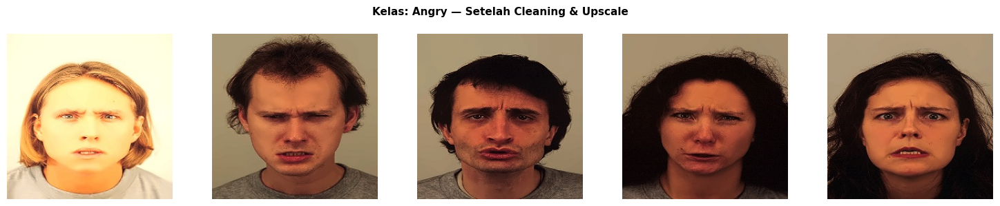

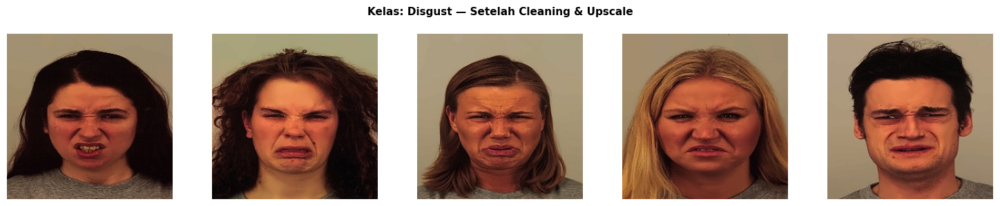

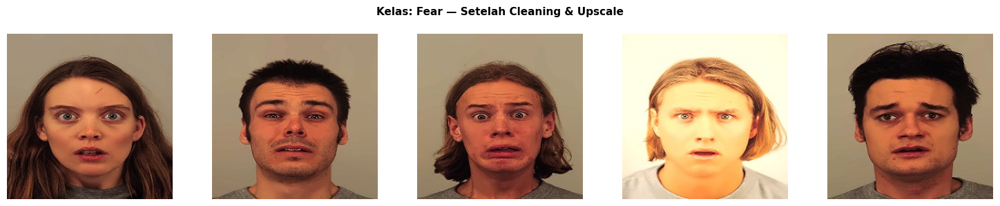

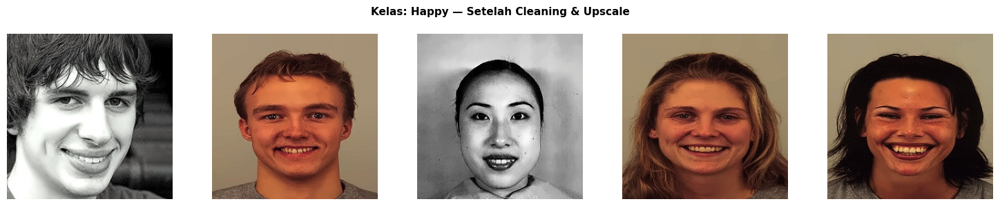

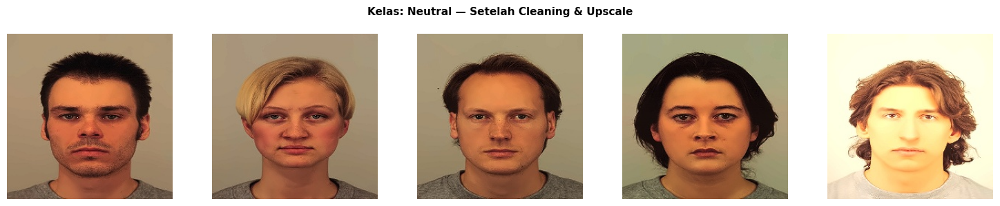

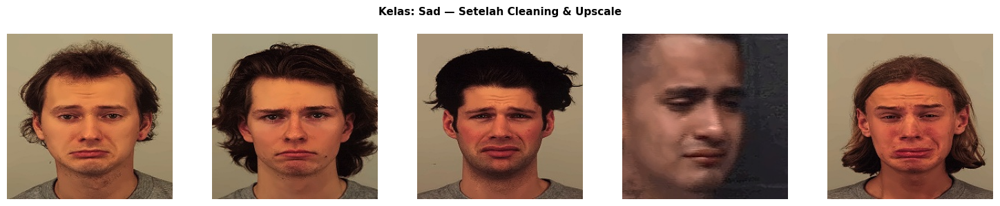

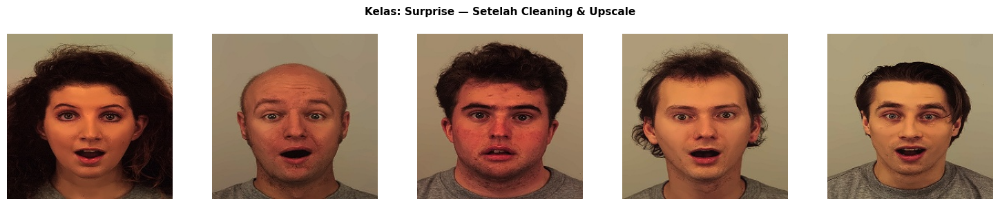

In [ ]:
n_cols = 5
emotions_clean = sorted(os.listdir(path_tujuan))

for emotion in emotions_clean:
    folder = os.path.join(path_tujuan, emotion)
    files  = [f for f in os.listdir(folder) if f.lower().endswith(('.jpg','.png','.jpeg'))]
    samples = random.sample(files, min(n_cols, len(files)))

    plt.figure(figsize=(15, 3))
    plt.suptitle(f'Kelas: {emotion} — Setelah Cleaning & Upscale', fontsize=11, fontweight='bold')
    for j, fname in enumerate(samples):
        img = cv2.imread(os.path.join(folder, fname))
        plt.subplot(1, n_cols, j + 1)
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.axis('off')
    plt.tight_layout()
    plt.show()

**Insight** : Sampel hasil cleaning menunjukkan bahwa setiap kategori emosi tetap mempertahankan karakteristik ekspresinya. Detail wajah terlihat lebih jelas tanpa menghilangkan informasi penting yang berkaitan dengan emosi. Hal ini menunjukkan bahwa proses cleaning berhasil meningkatkan kualitas gambar tanpa merusak label atau makna ekspresi wajah.

## 6. Ringkasan EDA

In [17]:
clean_counts = {}
for emo in sorted(os.listdir(path_tujuan)):
    ep = os.path.join(path_tujuan, emo)
    if os.path.isdir(ep):
        clean_counts[emo] = len(os.listdir(ep))

sizes_set, is_gray = set(), True
for emotion in os.listdir(path_tujuan):
    folder = os.path.join(path_tujuan, emotion)
    for img_name in os.listdir(folder):
        img = cv2.imread(os.path.join(folder, img_name))
        if img is not None:
            sizes_set.add(img.shape)
            if not (np.array_equal(img[:,:,0], img[:,:,1]) and np.array_equal(img[:,:,1], img[:,:,2])):
                is_gray = False

def check_sharpness(img_bgr):
    """Laplacian variance — semakin tinggi semakin tajam"""
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    return cv2.Laplacian(gray, cv2.CV_64F).var()

def check_brightness(img_bgr):
    """Mean pixel grayscale — 0 gelap, 255 terang"""
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    return gray.mean()

def check_contrast(img_bgr):
    """Standar deviasi grayscale — semakin tinggi kontras semakin baik"""
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    return gray.std()

quality_data = []

for emo in sorted(os.listdir(path_sumber)):
    folder = os.path.join(path_sumber, emo)
    if not os.path.isdir(folder): continue
    files = [f for f in os.listdir(folder) if f.lower().endswith(('.jpg','.png','.jpeg'))]
    for fname in random.sample(files, min(40, len(files))):
        img = cv2.imread(os.path.join(folder, fname))
        if img is not None:
            quality_data.append({
                'label'     : emo,
                'sharpness' : check_sharpness(img),
                'brightness': check_brightness(img),
                'contrast'  : check_contrast(img),
                'height'    : img.shape[0],
                'width'     : img.shape[1],
            })

quality_df = pd.DataFrame(quality_data)

quality_clean = []
for emo in sorted(os.listdir(path_tujuan)):
    folder = os.path.join(path_tujuan, emo)
    if not os.path.isdir(folder): continue
    files = [f for f in os.listdir(folder) if f.lower().endswith(('.jpg','.png','.jpeg'))]
    for fname in random.sample(files, min(40, len(files))):
        img = cv2.imread(os.path.join(folder, fname))
        if img is not None:
            quality_clean.append({
                'label'     : emo,
                'sharpness' : check_sharpness(img),
                'brightness': check_brightness(img),
                'contrast'  : check_contrast(img),
                'status'    : 'Setelah Cleaning'
            })
quality_clean_df = pd.DataFrame(quality_clean)

print("=" * 55)
print("RINGKASAN EDA")
print("=" * 55)
print(f"Total gambar bersih : {sum(clean_counts.values())}")
print(f"Ukuran gambar       : {IMG_SIZE}x{IMG_SIZE} px (seragam)")
print(f"Format warna        : {'Grayscale' if is_gray else 'RGB'}")
print(f"Gambar rusak        : 0 (sudah dibersihkan)")
print()
print("Distribusi per kelas (setelah cleaning):")
for emo, cnt in clean_counts.items():
    print(f"  {emo:<12}: {cnt} gambar")
print()
print("Peningkatan kualitas:")
for metric in ['sharpness', 'brightness', 'contrast']:
    before = quality_df[metric].mean()
    after  = quality_clean_df[metric].mean()
    print(f"  {metric.capitalize():<12}: {before:.2f} -> {after:.2f}")
print("=" * 55)

RINGKASAN EDA
Total gambar bersih : 1049
Ukuran gambar       : 224x224 px (seragam)
Format warna        : RGB
Gambar rusak        : 0 (sudah dibersihkan)

Distribusi per kelas (setelah cleaning):
  Angry       : 155 gambar
  Disgust     : 149 gambar
  Fear        : 156 gambar
  Happy       : 162 gambar
  Neutral     : 160 gambar
  Sad         : 107 gambar
  Surprise    : 160 gambar

Peningkatan kualitas:
  Sharpness   : 101.73 -> 1497.60
  Brightness  : 93.75 -> 103.58
  Contrast    : 44.84 -> 51.23


**Insight :**
Cleaning berhasil meningkatkan kualitas visual dataset melalui proses upscale, denoise, dan sharpen. Gambar menjadi lebih jelas, lebih konsisten, dan lebih siap digunakan untuk tahap augmentasi serta pelatihan model.Dataset hasil cleaning dinilai layak untuk digunakan dalam pengembangan sistem klasifikasi emosi berbasis citra wajah.

---
# DATA AUGMENTASI

## 1. Konfigurasi

In [ ]:
SOURCE_DIR   = '/content/drive/MyDrive/Dataset_CitraWajah/Dataset_Final'
TARGET_DIR   = '/content/drive/MyDrive/Dataset_CitraWajah/Dataset_Aug_Final'
TARGET_COUNT = 1000

datagen = ImageDataGenerator(
    rotation_range=12,
    width_shift_range=0.08,
    height_shift_range=0.08,
    zoom_range=0.1,
    horizontal_flip=True,
    fill_mode='nearest'
)

if os.path.exists(TARGET_DIR):
    shutil.rmtree(TARGET_DIR)
    print("Folder lama dihapus.")
os.makedirs(TARGET_DIR, exist_ok=True)
print(f"Target per kelas : {TARGET_COUNT} gambar")

Target per kelas : 1000 gambar


## 2. Eksekusi Augmentasi

In [ ]:
def augment_to_target(src_dir, dst_dir, target_count):
    os.makedirs(dst_dir, exist_ok=True)
    print("=" * 50)
    print("PROSES DATA AUGMENTATION")
    print("=" * 50)

    for emotion in sorted(os.listdir(src_dir)):
        emo_path = os.path.join(src_dir, emotion)
        tgt_path = os.path.join(dst_dir, emotion)
        if not os.path.isdir(emo_path): continue
        os.makedirs(tgt_path, exist_ok=True)

        images = [f for f in os.listdir(emo_path) if f.lower().endswith(('.png','.jpg','.jpeg'))]
        if not images: continue

        for img_name in images:
            img = cv2.imread(os.path.join(emo_path, img_name))
            if img is None: continue
            img = cv2.resize(img, (224, 224))
            cv2.imwrite(os.path.join(tgt_path, img_name), img)

        needed = target_count - len(images)
        if needed > 0:
            arr = []
            for img_name in images:
                img = load_img(os.path.join(emo_path, img_name),
                               target_size=(224, 224), color_mode='grayscale')
                arr.append(img_to_array(img))
            arr = np.array(arr)
            aug_iter = datagen.flow(arr, batch_size=1)
            for g in range(needed):
                batch = next(aug_iter)
                aug_img = cv2.resize(batch[0].astype(np.uint8), (224, 224))
                cv2.imwrite(os.path.join(tgt_path, f"aug_{g}.jpg"), aug_img)

        final = len(os.listdir(tgt_path))
        extra = max(0, target_count - len(images))
        print(f"  {emotion:<12}: {len(images)} asli + {extra} aug = {final} gambar")

    print("\nAUGMENTASI SELESAI")

augment_to_target(SOURCE_DIR, TARGET_DIR, TARGET_COUNT)

PROSES DATA AUGMENTATION
  Angry       : 155 asli + 845 aug = 1000 gambar
  Disgust     : 149 asli + 851 aug = 1000 gambar
  Fear        : 156 asli + 844 aug = 1000 gambar
  Happy       : 162 asli + 838 aug = 1000 gambar
  Neutral     : 160 asli + 840 aug = 1000 gambar
  Sad         : 107 asli + 893 aug = 1000 gambar
  Surprise    : 160 asli + 840 aug = 1000 gambar

AUGMENTASI SELESAI


## 3. Verifikasi & Visualisasi Hasil Augmentasi

  Angry       : 1000 gambar
  Disgust     : 1000 gambar
  Fear        : 1000 gambar
  Happy       : 1000 gambar
  Neutral     : 1000 gambar
  Sad         : 1000 gambar
  Surprise    : 1000 gambar


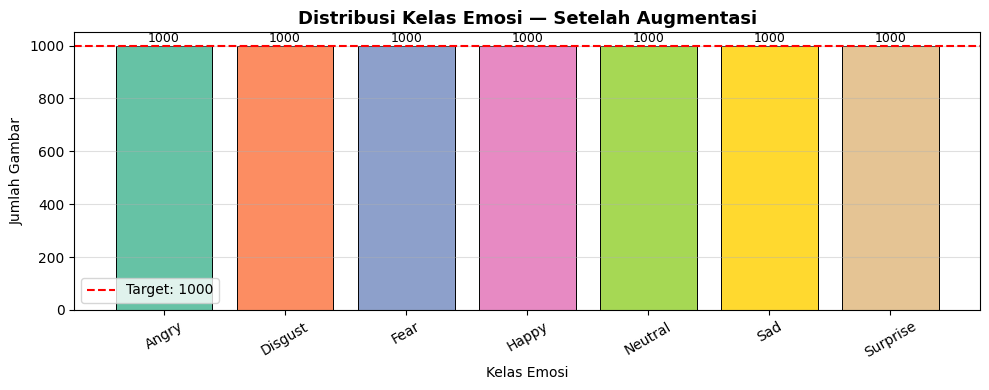

In [ ]:
aug_counts = {}
for emo in sorted(os.listdir(TARGET_DIR)):
    ep = os.path.join(TARGET_DIR, emo)
    if os.path.isdir(ep):
        aug_counts[emo] = len(os.listdir(ep))
        print(f"  {emo:<12}: {aug_counts[emo]} gambar")

aug_series = pd.Series(aug_counts)
plt.figure(figsize=(10, 4))
colors = sns.color_palette('Set2', len(aug_series))
bars = plt.bar(aug_series.index, aug_series.values, color=colors, edgecolor='black', linewidth=0.7)
plt.axhline(y=TARGET_COUNT, color='red', linestyle='--', linewidth=1.5, label=f'Target: {TARGET_COUNT}')
plt.title('Distribusi Kelas Emosi — Setelah Augmentasi', fontsize=13, fontweight='bold')
plt.xlabel('Kelas Emosi'); plt.ylabel('Jumlah Gambar')
plt.xticks(rotation=30); plt.legend()
for bar in bars:
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 2,
             str(int(bar.get_height())), ha='center', va='bottom', fontsize=9)
plt.grid(axis='y', alpha=0.4); plt.tight_layout(); plt.show()

**Insight** :
Augmentasi berhasil meningkatkan jumlah data pada setiap kategori emosi sehingga distribusi kelas menjadi lebih seimbang.
Variasi tambahan yang dihasilkan dapat membantu model belajar dari kondisi gambar yang lebih beragam.
Dataset hasil augmentasi memiliki representasi yang lebih baik dan dapat membantu mengurangi risiko overfitting selama proses pelatihan model.